In [23]:
import pandas as pd 
import plotly.express as px
import plotly.graph_objs as go

covid_dataframe = pd.read_csv('covid_19_data.csv')
covid_dataframe.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [24]:
# Getting the information by country and date
info_by_countries = covid_dataframe.groupby(['Country/Region', 'ObservationDate']).sum().reset_index().sort_values('ObservationDate', ascending=False)
info_by_countries = info_by_countries.drop_duplicates(subset = ['Country/Region'])
info_by_countries = info_by_countries[info_by_countries['Confirmed']>0]
info_by_countries

,Country/Region,ObservationDate,SNo,Confirmed,Deaths,Recovered
894,Angola,08/29/2020,97515,2551.0,107.0,1041.0
14081,India,08/29/2020,3624235,3542733.0,63498.0,2713933.0
1244,Argentina,08/29/2020,97517,401239.0,8353.0,287220.0
29819,Switzerland,08/29/2020,97657,41722.0,2005.0,35200.0
23024,North Macedonia,08/29/2020,97625,14293.0,596.0,11014.0
...,...,...,...,...,...,...
32910,Vatican City,03/09/2020,4507,1.0,0.0,0.0
23635,Palestine,03/09/2020,4322,22.0,0.0,0.0
25087,Republic of Ireland,03/08/2020,4067,21.0,0.0,0.0
22838,North Ireland,02/28/2020,2685,1.0,0.0,0.0


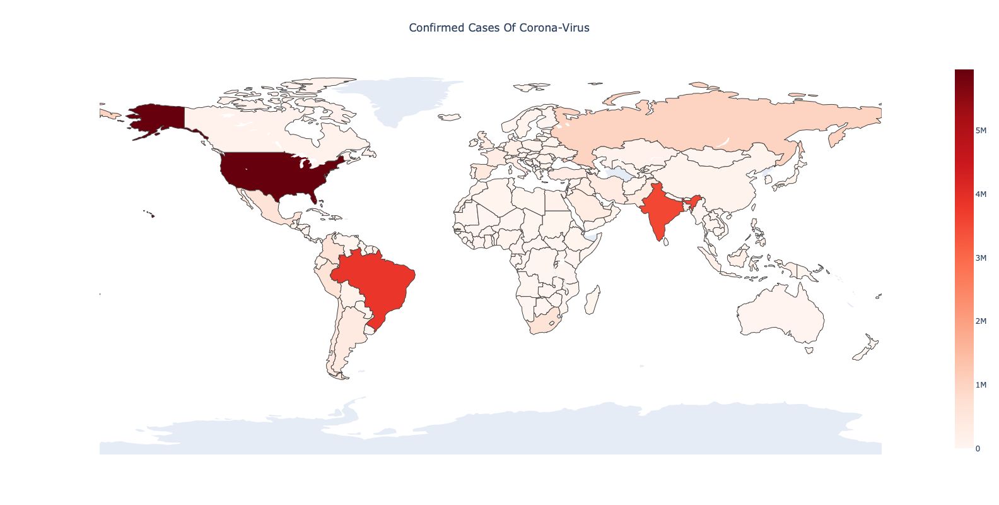

In [25]:
# Get the confirmed cases of Corono-Virus when hovered on a country and also the intensity

fig = go.Figure(data=go.Choropleth(
    locations = info_by_countries['Country/Region'],
    locationmode = 'country names',
    z = info_by_countries['Confirmed'],
    colorscale = 'Reds',
))
fig.update_layout(
    title_text = 'Confirmed Cases Of Corona-Virus',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
        projection_type = 'equirectangular'
    ),
    width=1000,
    height=800
)

In [5]:
# Get the data based on date to do the visualization based on the date
date_dataframe = covid_dataframe[covid_dataframe['Confirmed']>0]
date_dataframe = date_dataframe.groupby(['ObservationDate','Country/Region']).sum().reset_index()
date_dataframe

,ObservationDate,Country/Region,SNo,Confirmed,Deaths,Recovered
0,01/22/2020,Japan,36,2.0,0.0,0.0
1,01/22/2020,Macau,21,1.0,0.0,0.0
2,01/22/2020,Mainland China,373,547.0,17.0,28.0
3,01/22/2020,South Korea,38,1.0,0.0,0.0
4,01/22/2020,Taiwan,29,1.0,0.0,0.0
...,...,...,...,...,...,...
34028,08/29/2020,West Bank and Gaza,97674,21668.0,147.0,14631.0
34029,08/29/2020,Western Sahara,97675,10.0,1.0,8.0
34030,08/29/2020,Yemen,97676,1946.0,563.0,1113.0
34031,08/29/2020,Zambia,97677,11902.0,284.0,11092.0


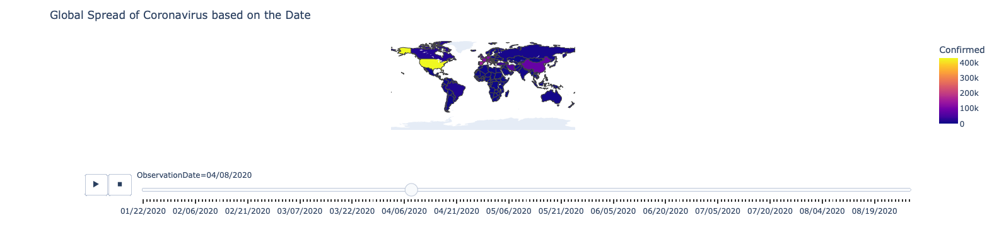

In [6]:
# visualize the covid cases by date
fig = px.choropleth(date_dataframe, 
                    locations="Country/Region", 
                    locationmode = "country names",
                    color="Confirmed", 
                    hover_name="Country/Region", 
                    animation_frame="ObservationDate"
                   )
fig.update_layout(
    title_text = 'Global Spread of Coronavirus based on the Date',
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
    
fig.show()

In [7]:
# Getting the data based on only date to collect the info about the daily increase in different type of case

datewise=covid_dataframe.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

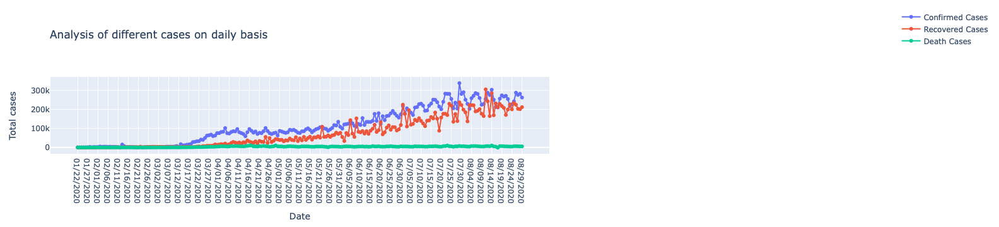

In [8]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Confirmed"].diff().fillna(0),mode='lines+markers',
                    name='Confirmed Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Recovered"].diff().fillna(0),mode='lines+markers',
                    name='Recovered Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Deaths"].diff().fillna(0),mode='lines+markers',
                    name='Death Cases'))
fig.update_layout(title="Analysis of different cases on daily basis",
                 xaxis_title="Date",yaxis_title="Total cases",legend=dict(x=1.7,y=1.9,traceorder="normal"))
fig.show()

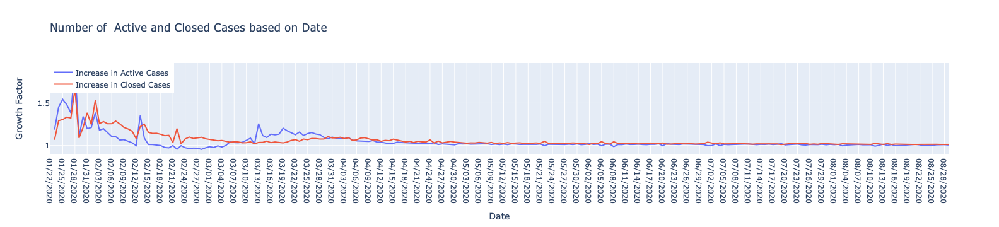

In [11]:
# Number of active and closed case

fig=go.Figure()
fig.add_trace(go.Scatter(x=datewise.index, 
                         y=(datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"])/(datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"]).shift(),
                    mode='lines',
                    name='Increase in Active Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=(datewise["Recovered"]+datewise["Deaths"])/(datewise["Recovered"]+datewise["Deaths"]).shift(),
                    mode='lines',
                    name='Increase in Closed Cases'))
fig.update_layout(title="Number of  Active and Closed Cases based on Date",
                 xaxis_title="Date",yaxis_title="Growth Factor",
                 legend=dict(x=0,y=1,traceorder="normal"))
fig.show()

In [15]:
# number of confirmed cases and death cases
covid_dataframe_lat = pd.read_csv('covid_19_data_lat_info.csv')

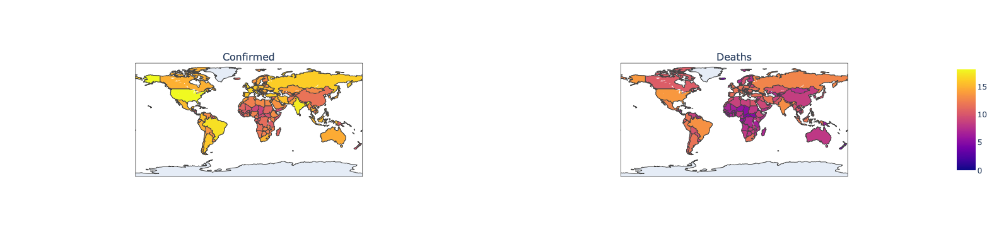

In [16]:
import numpy as np
from plotly.subplots import make_subplots


countrywise = pd.read_csv('countrywise.csv')
temp = covid_dataframe_lat[covid_dataframe_lat['Date']==max(covid_dataframe_lat['Date'])]
fig_c = px.choropleth(countrywise, locations='Country',locationmode='country names',
                     color = np.log(countrywise['Confirmed']), hover_name = 'Country',
                     hover_data = ['Confirmed'])
death_info= countrywise[countrywise['Deaths']>0]
fig_d = px.choropleth(death_info, locations='Country',locationmode='country names',
                     color = np.log(death_info['Deaths']), hover_name = 'Country',
                     hover_data = ['Deaths'])

fig = make_subplots(rows = 1, cols = 2, subplot_titles= ['Confirmed','Deaths'],
                   specs = [[{'type': 'choropleth'},{'type':'choropleth'}]])

fig.add_trace(fig_c['data'][0], row = 1, col = 1)
fig.add_trace(fig_d['data'][0], row = 1, col = 2)

fig.show()

In [17]:
# Tree analysis for confirmed and Death Cases

covid_dataframe_lat['Date']= pd.to_datetime(covid_dataframe_lat['Date'])
covid_dataframe_lat['Province/State']= covid_dataframe_lat['Province/State'].fillna("")

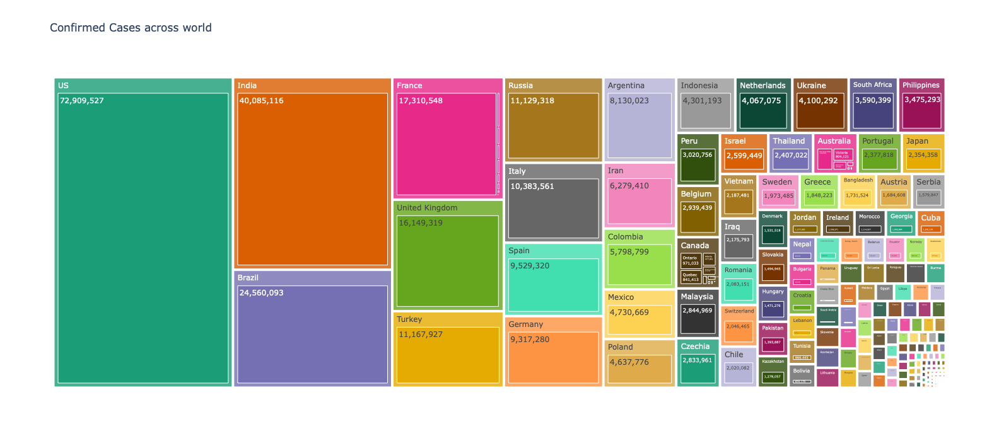

In [18]:
recent_info_confirmed = covid_dataframe_lat[covid_dataframe_lat['Date'] == max (covid_dataframe_lat['Date'])]


plot = px.treemap(recent_info_confirmed.sort_values(by = 'Confirmed', ascending = False).reset_index(drop = True),
                 path = ['Country', 'Province/State'], values = 'Confirmed', height = 700,
                 title = 'Confirmed Cases across world',
                  color_discrete_sequence = px.colors.qualitative.Dark2)

plot.data[0].textinfo = 'label+text+value'
plot.show()

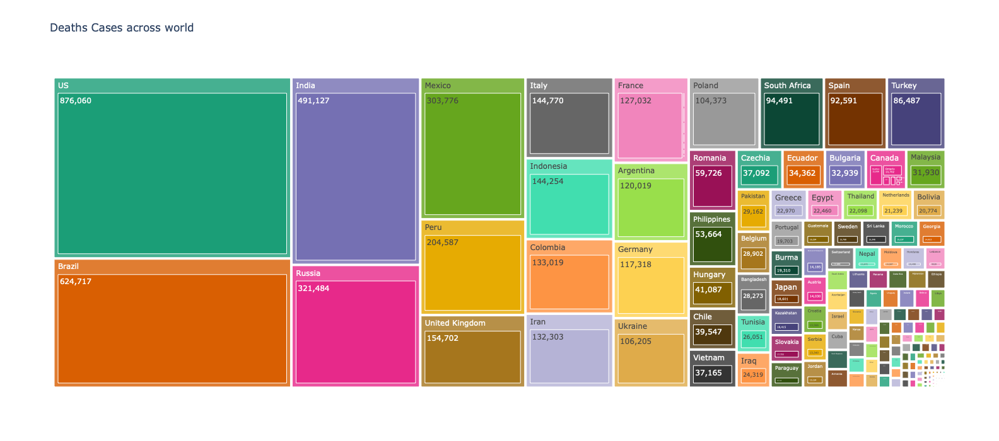

In [19]:
recent_info_death = covid_dataframe_lat[covid_dataframe_lat['Date'] == max(covid_dataframe_lat['Date'])]

plot = px.treemap(recent_info_death.sort_values(by = 'Deaths', ascending = False).reset_index(drop = True),
                 path = ['Country', 'Province/State'], values = 'Deaths', height = 700,
                 title = 'Deaths Cases across world',
                  color_discrete_sequence = px.colors.qualitative.Dark2)

plot.data[0].textinfo = 'label+text+value'
plot.show()

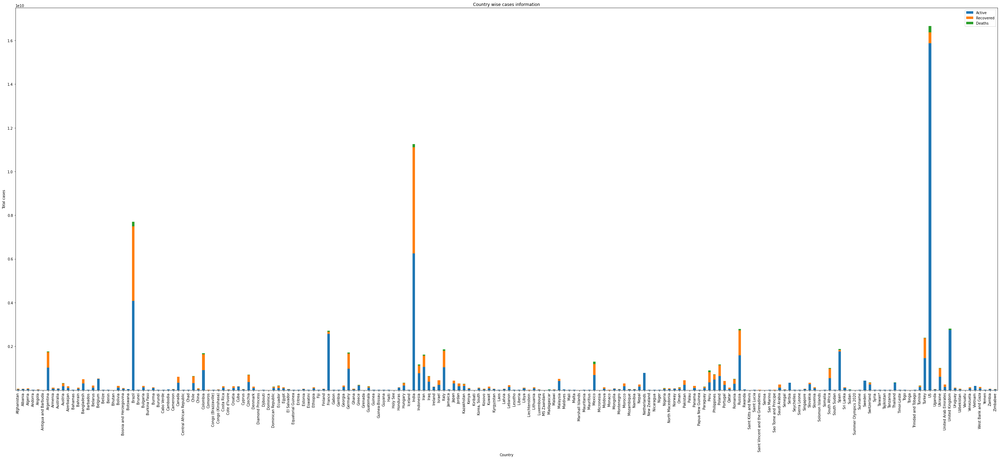

In [21]:
import matplotlib.pyplot as plt

df_country_info = covid_dataframe_lat.groupby(['Country'])[['Active', 'Recovered', 'Deaths']].sum().reset_index()
df_country_info.plot(kind='bar', stacked=True, x='Country', figsize=(50,20))
plt.xlabel('Country')
plt.ylabel('Total cases')
plt.title('Country wise cases information')
plt.show()


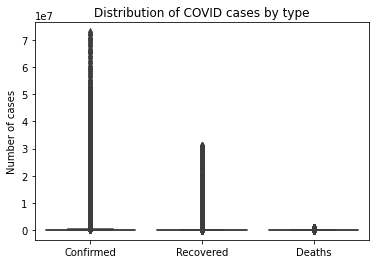

In [22]:
# In general the confirmed V/s Death V/s Recovered
import seaborn as sns

df_box = covid_dataframe_lat[['Confirmed', 'Recovered', 'Deaths']]
sns.boxplot(data=df_box)
plt.ylabel('Number of cases')
plt.title('Distribution of COVID cases by type')
plt.show()


In [27]:
# vaccinated people information 
import pandas as pd
import plotly.express as px
import pycountry

# Load the data
df = pd.read_csv('country_vaccinations.csv')


populations = {}
for country in pycountry.countries:
    try:
        populations[country.alpha_3] = country.population
    except AttributeError:
        pass

# create a population column
# df['population'] = df['iso_code'].map(populations)

# number of people who have still not been vaccinated
# df['people_remaining'] = df['population'] - df['people_vaccinated']


fig = px.choropleth(df, 
                    locations='iso_code', 
                    color='people_vaccinated_per_hundred', 
                    hover_name='country', 
                    hover_data=['people_vaccinated'], 
                    projection='mercator')

# Set the title and axis labels
fig.update_layout(title='COVID-19 Vaccinations by Country', 
                  geo=dict(showframe=False, showcoastlines=False, projection_type='mercator'))

# Display the map
fig.show()


In [21]:
from datetime import datetime, timedelta
now = datetime.utcnow() - timedelta(hours=19)

days_ago = (now - timedelta(days=7)).strftime("%Y-%m-%d")
vaccinations_df = pd.read_csv("vaccinations.csv")
vaccinations_df.reset_index(drop=True, inplace=True)
vaccinations_df.reset_index(inplace=True)
for loc in vaccinations_df['location'].unique():
    loc_ser = vaccinations_df.loc[vaccinations_df['location'] == loc].iloc[0]
    index = loc_ser['index']
    vaccinations_df.loc[index] = loc_ser.fillna(0)

vaccinations_df.fillna(method="ffill", inplace=True)
vaccinations_df.fillna(0, inplace=True)

In [22]:
vaccinations_df['one_dose'] = vaccinations_df['people_vaccinated'] - vaccinations_df['people_fully_vaccinated']
vaccinations_df['one_dose_per_hundred'] = (vaccinations_df['people_vaccinated_per_hundred'] - vaccinations_df['people_fully_vaccinated_per_hundred']).round(2)
vaccinations_df['population'] = (vaccinations_df['people_fully_vaccinated']/vaccinations_df['people_fully_vaccinated_per_hundred'].replace(0, 1)*100).astype(int)
vaccinations_df['how_many_more_vaccines'] = (2*(vaccinations_df['population'] - vaccinations_df['people_vaccinated']) + vaccinations_df['one_dose']).astype(int)
vaccinations_df['days_until_done'] = (vaccinations_df['how_many_more_vaccines']/vaccinations_df['daily_vaccinations'].replace(0, 1)).round(2)
vaccinations_df.head()

,index,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,...,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,one_dose,one_dose_per_hundred,population,how_many_more_vaccines,days_until_done
0,0,Afghanistan,AFG,2021-02-22,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0,0,0.0
1,1,Afghanistan,AFG,2021-02-23,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
2,2,Afghanistan,AFG,2021-02-24,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
3,3,Afghanistan,AFG,2021-02-25,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
4,4,Afghanistan,AFG,2021-02-26,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0


In [18]:
priority_list = ["United States", "Russia", "India", "China", "France", "United Kingdom", "Germany",
                "Japan", "Canada", "Australia"]

country_info= vaccinations_df.loc[vaccinations_df['date'] == days_ago]
country_info.sort_values("total_vaccinations", ascending=False, inplace=True)

priority_ser_list = []
for country in priority_list:
    filtered_df = country_info.loc[country_info['location'] == country]
    if not filtered_df.empty:
        priority_ser_list.append(filtered_df.iloc[0])


priority_df = pd.DataFrame(priority_ser_list)
not_priority_df = country_info.loc[~country_info['location'].isin(priority_list)]

country_info = priority_df.append(not_priority_df)
country_info.head()

/var/folders/s6/3zpv69vn7939njdmq8qdwbrm0000gn/T/ipykernel_8353/3460950568.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s6/3zpv69vn7939njdmq8qdwbrm0000gn/T/ipykernel_8353/3460950568.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,index,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,...,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,one_dose,one_dose_per_hundred,population,how_many_more_vaccines,days_until_done
123743,123743,Russia,RUS,2023-04-20,1.866396e+08,8.879487e+07,7.970051e+07,2.038302e+07,71260.0,220.0,...,55.07,14.09,2.0,167.0,0.000,9094355.0,6.29,144725823,120956269,549801.22
68421,68421,India,IND,2023-04-20,2.206601e+09,1.027403e+09,9.519656e+08,2.272326e+08,682.0,546.0,...,67.17,16.03,0.0,140.0,0.000,75437397.0,5.33,1417248113,855127713,1566167.97
52642,52642,France,FRA,2023-04-20,1.544275e+08,5.467066e+07,5.318372e+07,4.765545e+07,1332.0,1192.0,...,78.43,70.27,18.0,107.0,0.000,1486943.0,2.19,67810428,27766475,23294.02
75281,75281,Japan,JPN,2023-04-20,3.835854e+08,1.047002e+08,1.033737e+08,1.755114e+08,5943.0,9601.0,...,83.40,141.60,77.0,307.0,0.000,1326503.0,1.07,123949321,39824671,4147.97
164097,164097,World,OWID_WRL,2023-04-20,1.337327e+10,5.577957e+09,5.129401e+09,2.761313e+09,70802.0,236770.0,...,64.32,34.62,30.0,151237.0,0.002,448556115.0,5.62,7974815363,5242272127,22140.78


In [19]:
def country_visualization(var, title, yaxis = 'Percentage', days_prev = 30):
    c = 0
    buttons_list = []
    base_list = [False for i in range(len(country_info))]
    for i in country_info.index:
        tmp_list = base_list.copy()
        tmp_list[c] = True
        buttons_list.append(dict(
            args=[{"visible": tmp_list}],
            label=country_info.loc[i]['location'],
            method="update"
        ))
        c += 1

    c = 0
    fig = go.Figure()
    for i in country_info.index:
        location_name = country_info.loc[i]['location']
        prev_df = vaccinations_df.loc[vaccinations_df['location'] == location_name][-days_prev:]
        fig.add_trace(go.Scatter(name=location_name, x=prev_df["date"], y=prev_df[var], visible=False if c != 0 else True))
        c += 1

    fig.update_layout(
        updatemenus=[
            dict(
                buttons=buttons_list,
                direction="down",
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0.1,
                xanchor="left",
                y=1.1,
                yanchor="top"
            ),
        ]
    )

    fig.update_layout(title={'text': f'{title} - World, Past {days_prev} Days', 'x': 0.5,
                         'xanchor': 'center', 'font': {'size': 20}}, showlegend=False, yaxis_title=f"{yaxis}")
    fig.show()


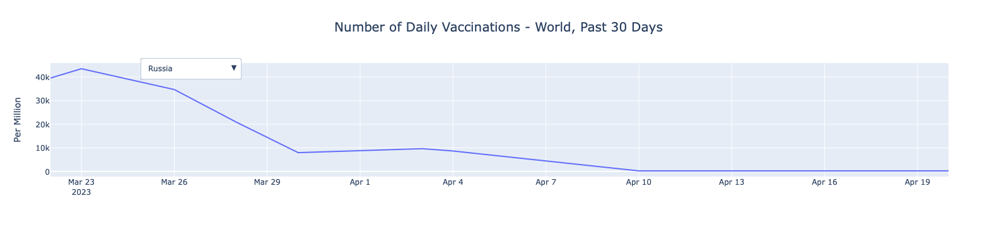

In [13]:
#
country_visualization('daily_vaccinations', 'Number of Daily Vaccinations', yaxis='Per Million')

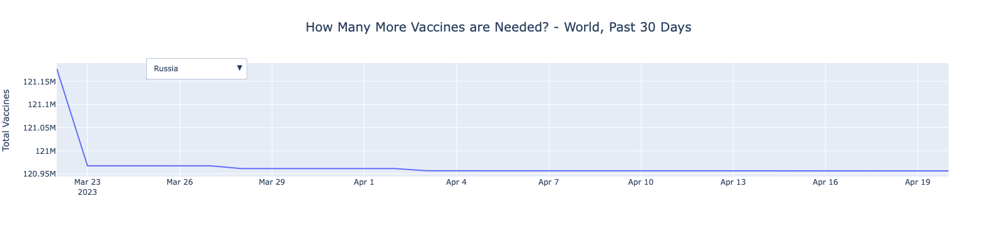

In [14]:
#
country_visualization('how_many_more_vaccines', 'How Many More Vaccines are Needed?', yaxis="Total Vaccines")